In [1]:

from pathlib import Path
from typing import List

import matplotlib.pyplot as plt
import numpy as np
import SimpleITK as sitk
import tqdm

# show the combined negative control image
from IPython.display import (
    Image as IPImage,
)
from PIL import Image, ImageDraw, ImageFont
from rich import print  # type: ignore # noqa

from readii.image_processing import displayCTSegOverlay, getCroppedImages
from readii.loaders import loadDicomSITK, loadRTSTRUCTSITK
from readii.negative_controls_refactor import NegativeControlManager



In [2]:

class VisualizeNegativeControl:
    """
    Class for visualizing and saving negative control strategies applied to images.

    Attributes
    ----------
    results_dir : Path
        Directory to save all generated GIFs.
    """

    def __init__(self, results_dir: Path) -> None:
        """
        Initialize the VisualizeNegativeControl class.

        Parameters
        ----------
        results_dir : Path
            Directory to save the results.
        """
        self.results_dir = results_dir
        self.results_dir.mkdir(exist_ok=True)
        
    def save_gif_from_slices(self, ct_image: sitk.Image, seg_image: sitk.Image, output_path: Path, control_name: str = None, region_name: str = None) -> None:
        """
        Save a 3D SimpleITK image as an animated GIF with optional text overlay.

        Parameters
        ----------
        ct_image : sitk.Image
                The 3D SimpleITK image to save as a GIF.
        seg_image : sitk.Image
                The segmentation image to overlay on the CT image.
        output_path : Path
                The file path to save the GIF.
        control_name : str, optional
                The name of the control strategy (to overlay on the image).
        region_name : str, optional
                The name of the region strategy (to overlay on the image).

        Returns
        -------
        None
        """
        array = sitk.GetArrayFromImage(ct_image)
        seg_array = sitk.GetArrayFromImage(seg_image)

        slices = []
        for i in range(array.shape[0]):
            fig, ax = plt.subplots()
            displayCTSegOverlay(
                ctImage=array,
                segImage=seg_array,
                sliceIdx=i,
                cmapCT=plt.cm.Greys_r,
                cmapSeg=plt.cm.brg,
                alpha=0.3,
                crop=False,
            )
            ax.set_title(f"{control_name or ''} | {region_name or ''}".strip(" | "))
            fig.canvas.draw()

            # Convert plot to image
            img = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
            img = img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
            slices.append(Image.fromarray(img))
            plt.close(fig)

        # Save slices as GIF
        slices[0].save(
            output_path,
            save_all=True,
            append_images=slices[1:],
            duration=100,
            loop=0,
        )

    def create_large_gif(self, output_path: Path, control_files: List[Path], original_file: Path) -> Path:
        """
        Create a large GIF combining multiple smaller GIFs into a grid.

        Parameters
        ----------
        output_path : Path
            Path to save the resulting large GIF.
        control_files : list of Path
            List of file paths for the control GIFs to arrange in a 3x3 grid.
        original_file : Path
            Path to the original GIF to be placed to the right of the grid.

        Returns
        -------
        None
        """
        control_frames = [Image.open(f) for f in control_files]
        original_frames = Image.open(original_file)

        # Get dimensions of a single frame
        frame_width, frame_height = control_frames[0].size
        num_frames = min(
            [gif.n_frames for gif in control_frames] + [original_frames.n_frames]
        )

        # Define padding
        padding = 10

        # Dimensions for the large GIF
        grid_width = (frame_width * 3) + (padding * 2)
        grid_height = (frame_height * 3) + (padding * 2)
        total_width = grid_width + frame_width + padding

        combined_frames = []
        for i in range(num_frames):
            combined_frame = Image.new("RGB", (total_width, grid_height), "black")
            for j, control_frame in enumerate(control_frames):
                control_frame.seek(i)
                x_offset = (j % 3) * frame_width + ((j % 3) * padding)
                y_offset = (j // 3) * frame_height + ((j // 3) * padding)
                combined_frame.paste(control_frame, (x_offset, y_offset))

            original_frames.seek(i)
            combined_frame.paste(original_frames, (grid_width + padding, 0))

            # Add frame counter
            draw = ImageDraw.Draw(combined_frame)
            text = f"frame: {i + 1}/{num_frames}"
            font = ImageFont.load_default()
            text_width = draw.textlength(text, font=font)
            text_height = font.size
            text_position = (total_width - text_width - 10, grid_height - text_height - 10)
            draw.text(text_position, text, fill="white", font=font)

            combined_frames.append(combined_frame)

        combined_frames[0].save(
            output_path,
            save_all=True,
            append_images=combined_frames[1:],
            duration=100,
            loop=0,
        )
        print(f"Large GIF saved at {output_path}")
        return output_path


# Using the Negative Control Manager to generate negative controls

In [3]:

dataset_path = Path.cwd().parent / "tests" / "4D-Lung" 

ct_dir = dataset_path / "113_HM10395/11-26-1999-NA-p4-13296/1.000000-P4P113S303I10349 Gated 40.0B-29543" 
rtstruct_dir = dataset_path / "113_HM10395/11-26-1999-NA-p4-13296/1.000000-P4P113S303I10349 Gated 40.0B-47.35"
rtstruct_file = next(rtstruct_dir.glob("*.dcm"))

ct = loadDicomSITK(ct_dir)

ROI_OF_INTEREST = "Tumor_c40"
rt = loadRTSTRUCTSITK(
  rtstruct_file, 
  ct_dir, 
  roiNames=[ROI_OF_INTEREST]
).get(ROI_OF_INTEREST)
print(f"CT image: {ct.GetSize()}")
print(f"RTSTRUCT image: {rt.GetSize()}")

CT image: (512, 512, 99)

RTSTRUCT image: (512, 512, 99)

In [4]:
RANDOM_SEED = 42
ncm = NegativeControlManager.from_strings(
  negative_control_types=["sampled", "shuffled", "randomized"],
  region_types=["roi", "non_roi", "full"],
  random_seed=RANDOM_SEED,
)

print(ncm)

NegativeControlManager(negative_controls=3, regions=3)

Processing Original...:   0%|          | 0/10 [00:00<?, ?it/s]/var/folders/8t/rwh6rzg93jxfqkb63gt2n4940000gn/T/ipykernel_48142/2249224510.py:63: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  img = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
Processing... (9/9):  90%|█████████ | 9/10 [00:08<00:00,  1.19it/s]

Large GIF saved at TRASH/4D-Lung-cropped/combined.gif

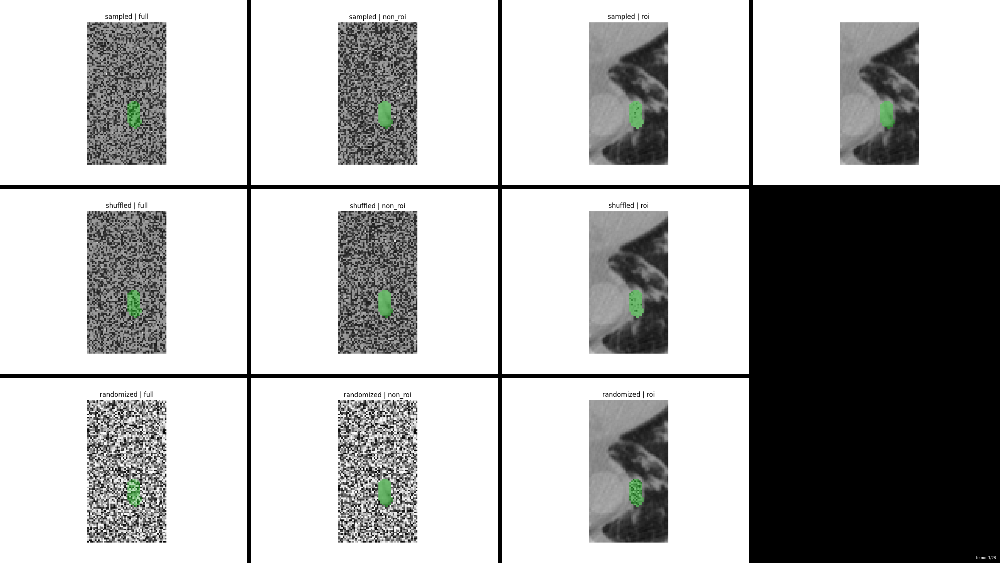

In [6]:

ct_cropped, rt_cropped = getCroppedImages(ct, rt)

# Create NegativeControlManager from string inputs
manager = NegativeControlManager.from_strings(
    negative_control_types=["sampled", "shuffled", "randomized"],
    region_types=["full", "non_roi", "roi"],
    random_seed=42,
)

progress_bar = tqdm.tqdm(total=len(manager.negative_control_strategies) * len(manager.region_strategies) + 1)
progress_bar.set_description("Processing Original...")
visualizer = VisualizeNegativeControl(results_dir=Path("TRASH", "4D-Lung-cropped"))
visualizer.save_gif_from_slices(ct_cropped, rt_cropped, visualizer.results_dir / "original.gif")
control_paths = []

for i, (image, control_name, region_name) in enumerate(manager.apply(ct_cropped, rt_cropped)):
    progress_bar.set_description(f"Processing... ({i + 1}/{len(manager.negative_control_strategies) * len(manager.region_strategies)})")
    output_path = Path("TRASH", "4D-Lung-cropped", f"{control_name}_{region_name}.gif")
    visualizer.save_gif_from_slices(image, rt_cropped, output_path, control_name=control_name, region_name=region_name)
    control_paths.append(output_path)
    progress_bar.update(1)

# Create a large GIF combining all control strategies
output_path = visualizer.create_large_gif(
    output_path=Path("TRASH", "4D-Lung-cropped", "combined.gif"),
    control_files=control_paths,
    original_file=Path("TRASH", "4D-Lung-cropped", "original.gif"),
)
IPImage(output_path)